In [1]:
import numpy as np
import matplotlib.pyplot as plt
import muram as mio
from astropy.io import fits
import pyflct
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
from matplotlib import font_manager
import matplotlib as mpl
font_path = '/home/mistflow/.fonts/cmunrm.ttf'  # Your font path goes here
#font_path = '/usr/share/fonts/opentype/urw-base35/NimbusRoman-Italic.otf'
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)
mpl.rcParams["font.size"] = 14
mpl.rcParams['axes.formatter.useoffset'] = False
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()
#plt.rc('text', usetex=True)
plt.rc('axes', unicode_minus=False)

In [3]:
from scipy.stats import pearsonr
from scipy.ndimage import gaussian_filter
from scipy.stats import linregress

In [4]:
def temporal_avg(data_in, start, end):
    tmp_avg = np.mean(data_in[start:end+1], axis = 0)
    return tmp_avg

In [5]:
def mean_v_from_file(file):
    v_x = fits.open(file)[0].data
    v_x.shape
    v_x = v_x[0:90]
    v_x = np.mean(v_x, axis=0)
    small = np.where(v_x < -6.5)
    v_x[small] = -6.5
    big = np.where(v_x > 6.5)
    v_x[big] = 6.5
    return v_x

def mean_vy_from_file(file):
    v_x = fits.open(file)[1].data
    v_x.shape
    v_x = v_x[0:90]
    v_x = np.mean(v_x, axis=0)
    small = np.where(v_x < -6.5)
    v_x[small] = -6.5
    big = np.where(v_x > 6.5)
    v_x[big] = 6.5
    return v_x

<h1>11. 01. 2025.</h1>

<h2>Tracking on Bz vs. simulated velocities at different $\tau$-s</h2>

<h3>$\log\tau=-1$</h3>

In [6]:
Vxm1 = fits.open("Velocities_TAU_0_1.fits")[1].data # Vy from Velocities.fits as originally thought
Vym1 = fits.open("Velocities_TAU_0_1.fits")[0].data # Vx from Velocities.fits as originally thought
Vxm1 = Vxm1[::3]
Vym1 = Vym1[::3]
Vxm1 = Vxm1.transpose(0, 2, 1)
Vym1 = Vym1.transpose(0, 2, 1)

In [7]:
Vxm1_mean = temporal_avg(Vxm1, 0, 90)
Vxm1_mean = Vxm1_mean/1E5
Vym1_mean = temporal_avg(Vym1, 0, 90)
Vym1_mean = Vym1_mean/1E5

In [8]:
Vxm1_filtered600 = gaussian_filter(Vxm1_mean, 11.25, mode = "wrap")
Vym1_filtered600 = gaussian_filter(Vym1_mean, 11.25, mode = "wrap")

In [9]:
Vx_Bz1 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Bz_tracked.fits")[0].data
Vy_Bz1 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Bz_tracked.fits")[1].data

In [10]:
Vx_Bz1_mean = temporal_avg(Vx_Bz1, 0, 90)
Vy_Bz1_mean = temporal_avg(Vy_Bz1, 0, 90)

In [11]:
Vx_Bz1_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Bz_tracked.fits")
Vy_Bz1_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Bz_tracked.fits")

In [12]:
Rxm1_reg = pearsonr((Vxm1[0]/1E5).flatten(), Vx_Bz1[0].flatten())
print(Rxm1_reg)

PearsonRResult(statistic=0.07391411867308671, pvalue=0.0)


In [13]:
Rym1_reg = pearsonr((Vym1[0]/1E5).flatten(), Vy_Bz1[0].flatten())
print(Rym1_reg)

PearsonRResult(statistic=0.3538113197779384, pvalue=0.0)


In [14]:
Rxm1_tav = pearsonr(Vxm1_mean.flatten(), Vx_Bz1_mean.flatten())
print(Rxm1_tav)

PearsonRResult(statistic=0.1450562210040627, pvalue=0.0)


In [15]:
Rym1_tav = pearsonr(Vym1_mean.flatten(), Vy_Bz1_mean.flatten())
print(Rym1_tav)

PearsonRResult(statistic=0.3321492245621691, pvalue=0.0)


<h3 style = "color:teal">Corrected values</h3>

In [16]:
RRRRx1B = pearsonr(Vxm1_filtered600.flatten(), Vx_Bz1_cor.flatten())
print(RRRRx1B)
RRRRy1B = pearsonr(Vym1_filtered600.flatten(), Vy_Bz1_cor.flatten())
print(RRRRy1B)

PearsonRResult(statistic=0.9086345563652478, pvalue=0.0)
PearsonRResult(statistic=0.9085953857725786, pvalue=0.0)


<h3>Usually done values</h3>

In [17]:
Rxm1_fil = pearsonr(Vxm1_filtered600.flatten(), Vx_Bz1_mean.flatten())
print(Rxm1_fil)

PearsonRResult(statistic=0.15084625660791076, pvalue=0.0)


In [18]:
Rym1_fil = pearsonr(Vym1_filtered600.flatten(), Vy_Bz1_mean.flatten())
print(Rym1_fil)

PearsonRResult(statistic=0.3457079683715483, pvalue=0.0)


/tmp/ipykernel_4828/2265653749.py:29: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/2265653749.py:30: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Bz_vs_SIM_logtaum1.png", dpi = 100)
/home/mistflow/anaconda3/envs/flct/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


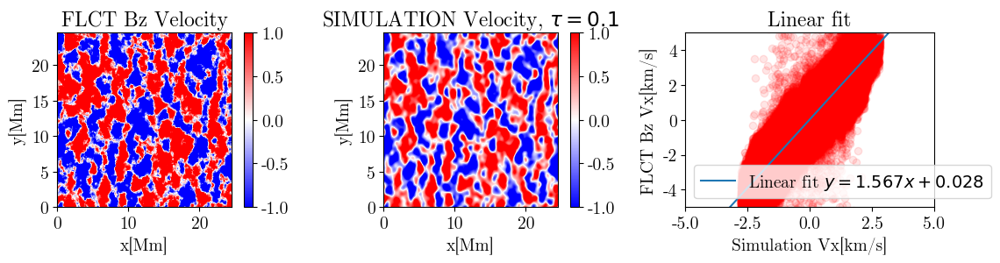

In [19]:
fig = plt.figure(figsize=[12, 3.2])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(131)                                      # atmos[1] temp
plt.title("FLCT Bz Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(3*Vx_Bz1_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(132)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.1$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm1_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(133)
plt.scatter(Vxm1_filtered600[:,:].flatten(), 3*Vx_Bz1_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Bz Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m, b, *_ = linregress(Vxm1_filtered600.flatten(), 3*Vx_Bz1_cor.flatten())
plt.axline(xy1=(0, b), slope=m, label=f'Linear fit $y = {m:.3f}x {b:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])
fig.tight_layout()
plt.savefig("300FLCT_Bz_vs_SIM_logtaum1.png", dpi = 100)

<h3>$\log\tau=-2$</h3>

In [20]:
Vxm2 = fits.open("Velocities_TAU_0_010.fits")[1].data # Vy from Velocities.fits as originally thought
Vym2 = fits.open("Velocities_TAU_0_010.fits")[0].data # Vx from Velocities.fits as originally thought
Vxm2 = Vxm2[::3]
Vym2 = Vym2[::3]
Vxm2 = Vxm2.transpose(0, 2, 1)
Vym2 = Vym2.transpose(0, 2, 1)

In [21]:
Vxm2_mean = temporal_avg(Vxm2, 0, 90)
Vxm2_mean = Vxm2_mean/1E5
Vym2_mean = temporal_avg(Vym2, 0, 90)
Vym2_mean = Vym2_mean/1E5

In [22]:
Vxm2_filtered600 = gaussian_filter(Vxm2_mean, 11.25, mode = "wrap")
Vym2_filtered600 = gaussian_filter(Vym2_mean, 11.25, mode = "wrap")

In [23]:
Vx_Bz2 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Bz_tracked.fits")[0].data
Vy_Bz2 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Bz_tracked.fits")[1].data

In [24]:
Vx_Bz2_mean = temporal_avg(Vx_Bz2, 0, 90)
Vy_Bz2_mean = temporal_avg(Vy_Bz2, 0, 90)

In [25]:
Vx_Bz2_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Bz_tracked.fits")
Vy_Bz2_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Bz_tracked.fits")

In [26]:
Rxm2_reg = pearsonr((Vxm2[0]/1E5).flatten(), Vx_Bz2[0].flatten())
print(Rxm2_reg)

PearsonRResult(statistic=0.45225159364006073, pvalue=0.0)


In [27]:
Rym2_reg = pearsonr((Vym2[0]/1E5).flatten(), Vy_Bz2[0].flatten())
print(Rym2_reg)

PearsonRResult(statistic=0.4834318701531966, pvalue=0.0)


In [28]:
Rxm2_tav = pearsonr(Vxm2_mean.flatten(), Vx_Bz2_mean.flatten())
print(Rxm2_tav)

PearsonRResult(statistic=0.6403984096368535, pvalue=0.0)


In [29]:
Rym2_tav = pearsonr(Vym2_mean.flatten(), Vy_Bz2_mean.flatten())
print(Rym2_tav)

PearsonRResult(statistic=0.7602952784333713, pvalue=0.0)


<h3 style = "color:teal">Corrected values</h3>

In [30]:
RRRRx2B = pearsonr(Vxm2_filtered600.flatten(), Vx_Bz2_cor.flatten())
print(RRRRx2B)
RRRRy2B = pearsonr(Vym2_filtered600.flatten(), Vy_Bz2_cor.flatten())
print(RRRRy2B)

PearsonRResult(statistic=0.8971248289407311, pvalue=0.0)
PearsonRResult(statistic=0.8964053515875997, pvalue=0.0)


<h3>Usually done values</h3>

In [31]:
Rxm2_fil = pearsonr(Vxm2_filtered600.flatten(), Vx_Bz2_mean.flatten())
print(Rxm2_fil)

PearsonRResult(statistic=0.6580207423831349, pvalue=0.0)


In [32]:
Rym2_fil = pearsonr(Vym2_filtered600.flatten(), Vy_Bz2_mean.flatten())
print(Rym2_fil)

PearsonRResult(statistic=0.7826362344216188, pvalue=0.0)


/tmp/ipykernel_4828/3176303753.py:29: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/3176303753.py:30: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Bz_vs_SIM_logtaum2.png", dpi = 100)


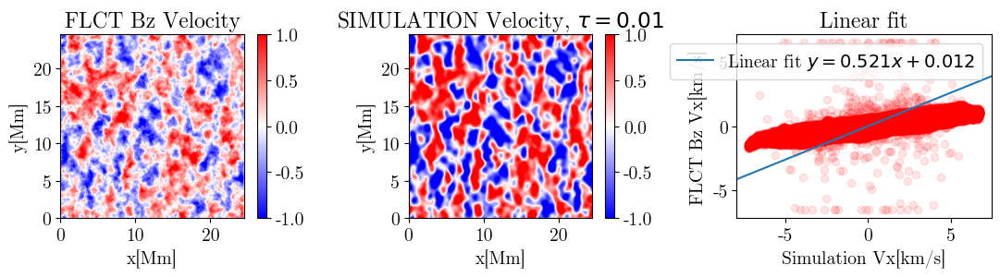

In [33]:
fig = plt.figure(figsize=[12, 3.2])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(131)                                      # atmos[1] temp
plt.title("FLCT Bz Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Bz2_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(132)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.01$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm2_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(133)
plt.scatter(3*Vxm2_filtered600[:,:].flatten(), Vx_Bz2_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Bz Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m2, b2, *_ = linregress(Vxm2_filtered600.flatten(), Vx_Bz2_cor.flatten())
plt.axline(xy1=(0, b2), slope=m2, label=f'Linear fit $y = {m2:.3f}x {b2:+.3f}$')
plt.legend()
#plt.xlim([-5,5])
#plt.ylim([-5,5])
fig.tight_layout()
plt.savefig("300FLCT_Bz_vs_SIM_logtaum2.png", dpi = 100)

<h3>$\log\tau=-3$</h3>

In [34]:
Vxm3 = fits.open("Velocities_TAU_0_001.fits")[1].data # Vy from Velocities.fits as originally thought
Vym3 = fits.open("Velocities_TAU_0_001.fits")[0].data # Vx from Velocities.fits as originally thought
Vxm3 = Vxm3[::3]
Vym3 = Vym3[::3]
Vxm3 = Vxm3.transpose(0, 2, 1)
Vym3 = Vym3.transpose(0, 2, 1)

In [35]:
Vxm3_mean = temporal_avg(Vxm3, 0, 90)
Vxm3_mean = Vxm3_mean/1E5
Vym3_mean = temporal_avg(Vym3, 0, 90)
Vym3_mean = Vym3_mean/1E5

In [36]:
Vxm3_filtered600 = gaussian_filter(Vxm3_mean, 11.25, mode = "wrap")
Vym3_filtered600 = gaussian_filter(Vym3_mean, 11.25, mode = "wrap")

In [37]:
Vx_Bz3 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Bz_tracked.fits")[0].data
Vy_Bz3 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Bz_tracked.fits")[1].data

In [38]:
fh = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Bz_tracked.fits")[0]
fh.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1536                                                  
NAXIS2  =                 1536                                                  
NAXIS3  =                  120                                                  
EXTEND  =                    T                                                  
UNITS   = 'km/s    '                                                            
TRACKED = 'Bz      '                                                            
WHEN_RUN=   1739954788.8768497                                                  
AUTHOR  = 'Teodor  '                                                            
TAU     =                  1.0                                                  
FWHM    =                  3

In [39]:
Vx_Bz3_mean = temporal_avg(Vx_Bz3, 0, 90)
Vy_Bz3_mean = temporal_avg(Vy_Bz3, 0, 90)

In [40]:
Vx_Bz3_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Bz_tracked.fits")
Vy_Bz3_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Bz_tracked.fits")

In [41]:
Rxm3_reg = pearsonr((Vxm3[0]/1E5).flatten(), Vx_Bz3[0].flatten())
print(Rxm3_reg)

PearsonRResult(statistic=0.5230418081765413, pvalue=0.0)


In [42]:
Rym3_reg = pearsonr((Vym3[0]/1E5).flatten(), Vy_Bz3[0].flatten())
print(Rym3_reg)

PearsonRResult(statistic=0.49077510357122367, pvalue=0.0)


In [43]:
Rxm3_tav = pearsonr(Vxm3_mean.flatten(), Vx_Bz3_mean.flatten())
print(Rxm3_tav)

PearsonRResult(statistic=0.5322734287334304, pvalue=0.0)


In [44]:
Rym3_tav = pearsonr(Vym3_mean.flatten(), Vy_Bz3_mean.flatten())
print(Rym3_tav)

PearsonRResult(statistic=0.5071628954035472, pvalue=0.0)


<h3 style = "color:teal">Corrected values</h3>

In [45]:
RRRRx3B = pearsonr(Vxm3_filtered600.flatten(), Vx_Bz3_cor.flatten())
print(RRRRx3B)
RRRRy3B = pearsonr(Vym3_filtered600.flatten(), Vy_Bz3_cor.flatten())
print(RRRRy3B)

PearsonRResult(statistic=0.8624940550684826, pvalue=0.0)
PearsonRResult(statistic=0.8488819082506497, pvalue=0.0)


<h3>Usually done values</h3>

In [46]:
Rxm3_fil = pearsonr(Vxm3_filtered600.flatten(), Vx_Bz3_mean.flatten())
print(Rxm3_fil)

PearsonRResult(statistic=0.5490499249558114, pvalue=0.0)


In [47]:
Rym3_fil = pearsonr(Vym3_filtered600.flatten(), Vy_Bz3_mean.flatten())
print(Rym3_fil)

PearsonRResult(statistic=0.525762746165358, pvalue=0.0)


/tmp/ipykernel_4828/3166058384.py:29: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/3166058384.py:30: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Bz_vs_SIM_logtaum3.png", dpi = 100)


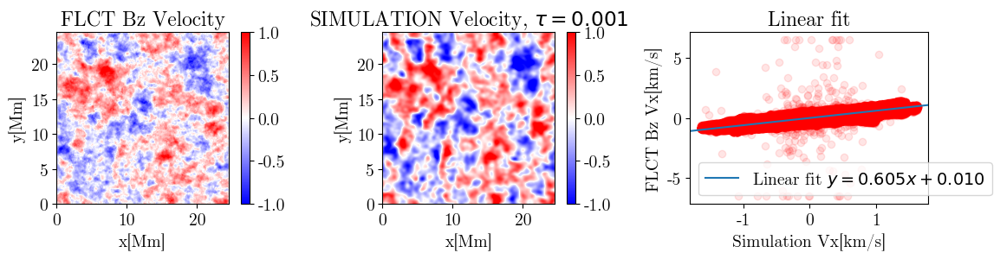

In [48]:
fig = plt.figure(figsize=[12, 3.2])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(131)                                      # atmos[1] temp
plt.title("FLCT Bz Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Bz3_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(132)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm3_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(133)
plt.scatter(Vxm3_filtered600[:,:].flatten(), Vx_Bz3_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Bz Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m3, b3, *_ = linregress(Vxm3_filtered600.flatten(), Vx_Bz3_cor.flatten())
plt.axline(xy1=(0, b3), slope=m3, label=f'Linear fit $y = {m3:.3f}x {b3:+.3f}$')
plt.legend()
#plt.xlim([-5,5])
#plt.ylim([-5,5])
fig.tight_layout()
plt.savefig("300FLCT_Bz_vs_SIM_logtaum3.png", dpi = 100)

<h3>$\log\tau=-4$</h3>

In [49]:
Vxm4 = fits.open("Velocities_TAU_0_0001.fits")[1].data # Vy from Velocities.fits as originally thought
Vym4 = fits.open("Velocities_TAU_0_0001.fits")[0].data # Vx from Velocities.fits as originally thought
Vxm4 = Vxm4[::3]
Vym4 = Vym4[::3]
Vxm4 = Vxm4.transpose(0, 2, 1)
Vym4 = Vym4.transpose(0, 2, 1)

In [50]:
Vxm4_mean = temporal_avg(Vxm4, 0, 90)
Vxm4_mean = Vxm4_mean/1E5
Vym4_mean = temporal_avg(Vym4, 0, 90)
Vym4_mean = Vym4_mean/1E5

In [51]:
Vxm4_filtered600 = gaussian_filter(Vxm4_mean, 11.25, mode = "wrap")
Vym4_filtered600 = gaussian_filter(Vym4_mean, 11.25, mode = "wrap")

In [52]:
Vx_Bz4 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Bz_tracked.fits")[0].data
Vy_Bz4 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Bz_tracked.fits")[1].data

In [53]:
Vx_Bz4_mean = temporal_avg(Vx_Bz4, 0, 90)
Vy_Bz4_mean = temporal_avg(Vy_Bz4, 0, 90)

In [54]:
Vx_Bz4_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Bz_tracked.fits")
Vy_Bz4_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Bz_tracked.fits")

In [55]:
Rxm4_reg = pearsonr((Vxm4[0]/1E5).flatten(), Vx_Bz4[0].flatten())
print(Rxm4_reg)

PearsonRResult(statistic=0.3875749257652154, pvalue=0.0)


In [56]:
Rym4_reg = pearsonr((Vym4[0]/1E5).flatten(), Vy_Bz4[0].flatten())
print(Rym4_reg)

PearsonRResult(statistic=0.46099915070299224, pvalue=0.0)


In [57]:
Rxm4_tav = pearsonr(Vxm4_mean.flatten(), Vx_Bz4_mean.flatten())
print(Rxm4_tav)

PearsonRResult(statistic=0.2878672845641573, pvalue=0.0)


In [58]:
Rym4_tav = pearsonr(Vym4_mean.flatten(), Vy_Bz4_mean.flatten())
print(Rym4_tav)

PearsonRResult(statistic=0.7114667129351683, pvalue=0.0)


<h3 style = "color:teal">Corrected values</h3>

In [59]:
RRRRx4B = pearsonr(Vxm4_filtered600.flatten(), Vx_Bz4_cor.flatten())
print(RRRRx4B)
RRRRy4B = pearsonr(Vym4_filtered600.flatten(), Vy_Bz4_cor.flatten())
print(RRRRy4B)

PearsonRResult(statistic=0.8476043906846722, pvalue=0.0)
PearsonRResult(statistic=0.8616456840392309, pvalue=0.0)


<h3>Usually done values</h3>

In [60]:
Rxm4_fil = pearsonr(Vxm4_filtered600.flatten(), Vx_Bz4_mean.flatten())
print(Rxm4_fil)

PearsonRResult(statistic=0.30288961026220174, pvalue=0.0)


In [61]:
Rym4_fil = pearsonr(Vym4_filtered600.flatten(), Vy_Bz4_mean.flatten())
print(Rym4_fil)

PearsonRResult(statistic=0.7534875860995791, pvalue=0.0)


/tmp/ipykernel_4828/4213387034.py:29: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/4213387034.py:30: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Bz_vs_SIM_logtaum4.png", dpi = 100)


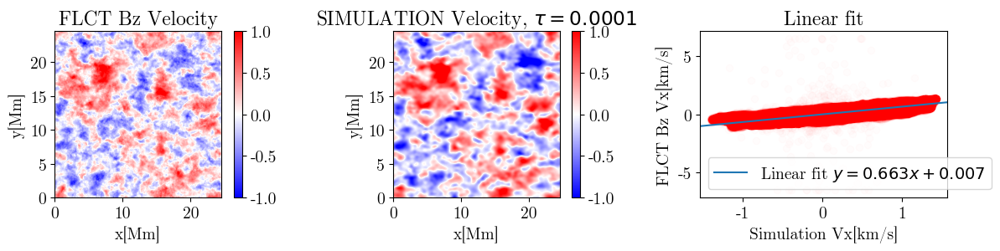

In [62]:
fig = plt.figure(figsize=[12, 3.2])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(131)                                      # atmos[1] temp
plt.title("FLCT Bz Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Bz4_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(132)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.0001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm4_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(133)
plt.scatter(Vxm4_filtered600[:,:].flatten(), Vx_Bz4_cor[:,:].flatten(), alpha=0.01, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Bz Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m4, b4, *_ = linregress(Vxm4_filtered600.flatten(), Vx_Bz4_cor.flatten())
plt.axline(xy1=(0, b4), slope=m4, label=f'Linear fit $y = {m4:.3f}x {b4:+.3f}$')
plt.legend()
#plt.xlim([-5,5])
#plt.ylim([-5,5])
fig.tight_layout()
plt.savefig("300FLCT_Bz_vs_SIM_logtaum4.png", dpi = 100)

<h2>12. 01. 2025</h2>

<h2>Tracking on Temperature vs. simulated velocities at different $\tau$-s</h2>

<h3>$log\tau=0$</h3>

In [63]:
Vx_Temp0_cor = mean_v_from_file("pyFLCT_fwhm_600_dt_30_logTaum0Temp_tracked.fits")
Vy_Temp0_cor = mean_vy_from_file("pyFLCT_fwhm_600_dt_30_logTaum0Temp_tracked.fits")

In [64]:
Vxm0 = fits.open("Velocities_TAU_1_0.fits")[1].data # Vy from Velocities.fits as originally thought
Vym0 = fits.open("Velocities_TAU_1_0.fits")[0].data # Vx from Velocities.fits as originally thought
Vxm0 = Vxm0.transpose(0, 2, 1)
Vym0 = Vym0.transpose(0, 2, 1)

In [65]:
Vxm0_mean = temporal_avg(Vxm0, 0, 90)
Vxm0_mean = Vxm0_mean/1E5
Vym0_mean = temporal_avg(Vym0, 0, 90)
Vym0_mean = Vym0_mean/1E5

In [66]:
Vxm0_filtered600 = gaussian_filter(Vxm0_mean, 22.5, mode = "wrap")
Vym0_filtered600 = gaussian_filter(Vym0_mean, 22.5, mode = "wrap")

In [67]:
Vx_Temp0 = fits.open("pyFLCT_fwhm_600_dt_30_logTaum0Temp_tracked.fits")[0].data
Vy_Temp0 = fits.open("pyFLCT_fwhm_600_dt_30_logTaum0Temp_tracked.fits")[1].data

In [68]:
Vx_Temp0_mean = temporal_avg(Vx_Temp0, 0, 90)
Vy_Temp0_mean = temporal_avg(Vy_Temp0, 0, 90)

In [69]:
Rxm0_regT = pearsonr((Vxm0[0]/1E5).flatten(), Vx_Temp0[0].flatten())
print(Rxm0_regT)

PearsonRResult(statistic=0.3744340165468067, pvalue=0.0)


In [70]:
Rym0_regT = pearsonr((Vym0[0]/1E5).flatten(), Vy_Temp0[0].flatten())
print(Rym0_regT)

PearsonRResult(statistic=0.4175382632942573, pvalue=0.0)


In [71]:
Rxm0_tavT = pearsonr(Vxm0_mean.flatten(), Vx_Temp0_mean.flatten())
print(Rxm0_tavT)

PearsonRResult(statistic=0.5958235067611463, pvalue=0.0)


In [72]:
Rym0_tavT = pearsonr(Vym0_mean.flatten(), Vy_Temp0_mean.flatten())
print(Rym0_tavT)

PearsonRResult(statistic=0.6886171795542453, pvalue=0.0)


<h3 style = "color:teal">Corrected pixel values</h3>

In [73]:
RRRRx0 = pearsonr(Vxm0_filtered600.flatten(), Vx_Temp0_cor.flatten())
print(RRRRx0)
RRRRy0 = pearsonr(Vym0_filtered600.flatten(), Vy_Temp0_cor.flatten())
print(RRRRy0)

PearsonRResult(statistic=0.9208954490230603, pvalue=0.0)
PearsonRResult(statistic=0.9210080112843272, pvalue=0.0)


<h3>Usually done values</h3>

In [74]:
Rxm0_filT = pearsonr(Vxm0_filtered600.flatten(), Vx_Temp0_mean.flatten())
print(Rxm0_filT)

PearsonRResult(statistic=0.6876213922846197, pvalue=0.0)


In [75]:
Rym0_filT = pearsonr(Vym0_filtered600.flatten(), Vy_Temp0_mean.flatten())
print(Rym0_filT)

PearsonRResult(statistic=0.7951084132319269, pvalue=0.0)


/tmp/ipykernel_4828/3858724747.py:56: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/3858724747.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("FLCT_Temp_vs_SIM_logtaum0.png", dpi = 100)


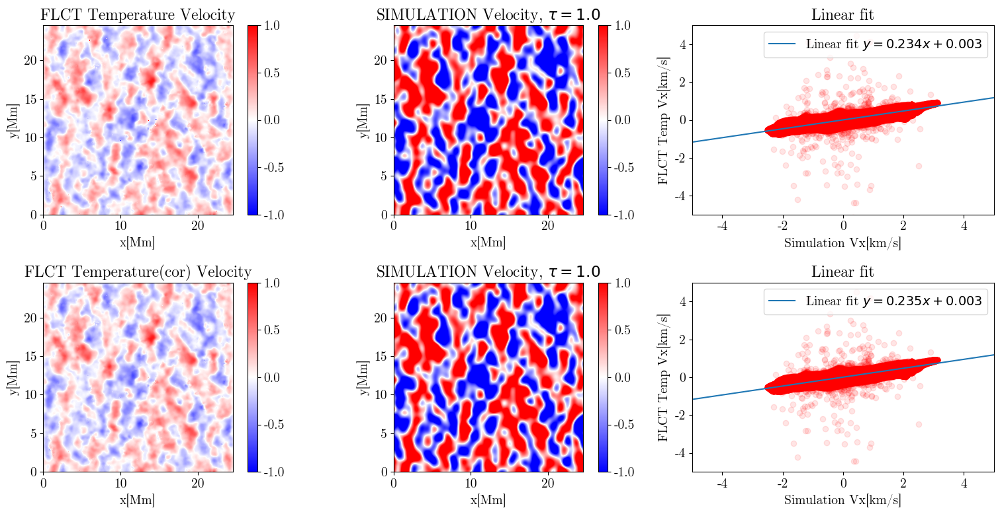

In [76]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp0_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Temp0_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0, b0, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Temp0_mean.flatten())
plt.axline(xy1=(0, b0), slope=m0, label=f'Linear fit $y = {m0:.3f}x {b0:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Temperature(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp0_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Temp0_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0c, b0c, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Temp0_cor.flatten())
plt.axline(xy1=(0, b0c), slope=m0c, label=f'Linear fit $y = {m0c:.3f}x {b0c:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])


fig.tight_layout()
plt.savefig("FLCT_Temp_vs_SIM_logtaum0.png", dpi = 100)

<h3>$log\tau=-1$</h3>

In [77]:
Vx_Temp1_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Temp_tracked.fits")
Vy_Temp1_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Temp_tracked.fits")

In [78]:
Vx_Temp1 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Temp_tracked.fits")[0].data
Vy_Temp1 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum1Temp_tracked.fits")[1].data

In [79]:
Vx_Temp1_mean = temporal_avg(Vx_Temp1, 0, 90)
Vy_Temp1_mean = temporal_avg(Vy_Temp1, 0, 90)

In [80]:
Rxm1_regT = pearsonr((Vxm1[0]/1E5).flatten(), Vx_Temp1[0].flatten())
print(Rxm1_regT)

PearsonRResult(statistic=0.06064643311007926, pvalue=0.0)


In [81]:
Rym1_regT = pearsonr((Vym1[0]/1E5).flatten(), Vy_Temp1[0].flatten())
print(Rym1_regT)

PearsonRResult(statistic=0.024359143604346448, pvalue=1.7683718430429817e-306)


In [82]:
Rxm1_tavT = pearsonr(Vxm1_mean.flatten(), Vx_Temp1_mean.flatten())
print(Rxm1_tavT)

PearsonRResult(statistic=0.14183476553086335, pvalue=0.0)


In [83]:
Rym1_tavT = pearsonr(Vym1_mean.flatten(), Vy_Temp1_mean.flatten())
print(Rym1_tavT)

PearsonRResult(statistic=0.23731753277144382, pvalue=0.0)


<h3 style="color:teal">Corrected pixel values (next two lines)</h3>

In [84]:
RRRRx1 = pearsonr(Vxm1_filtered600.flatten(), Vx_Temp1_cor.flatten())
print(RRRRx1)
RRRRy1 = pearsonr(Vym1_filtered600.flatten(), Vy_Temp1_cor.flatten())
print(RRRRy1)

PearsonRResult(statistic=0.6421386477342412, pvalue=0.0)
PearsonRResult(statistic=0.6487805855250303, pvalue=0.0)


<h3>Usually done values</h3>

In [85]:
Rxm1_filT = pearsonr(Vxm1_filtered600.flatten(), Vx_Temp1_mean.flatten())
print(Rxm1_filT)

PearsonRResult(statistic=0.1517435154646477, pvalue=0.0)


In [86]:
Rym1_filT = pearsonr(Vym1_filtered600.flatten(), Vy_Temp1_mean.flatten())
print(Rym1_filT)

PearsonRResult(statistic=0.2542915065205658, pvalue=0.0)


/tmp/ipykernel_4828/106911987.py:56: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/106911987.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Temp_vs_SIM_logtaum1.png", dpi = 100)


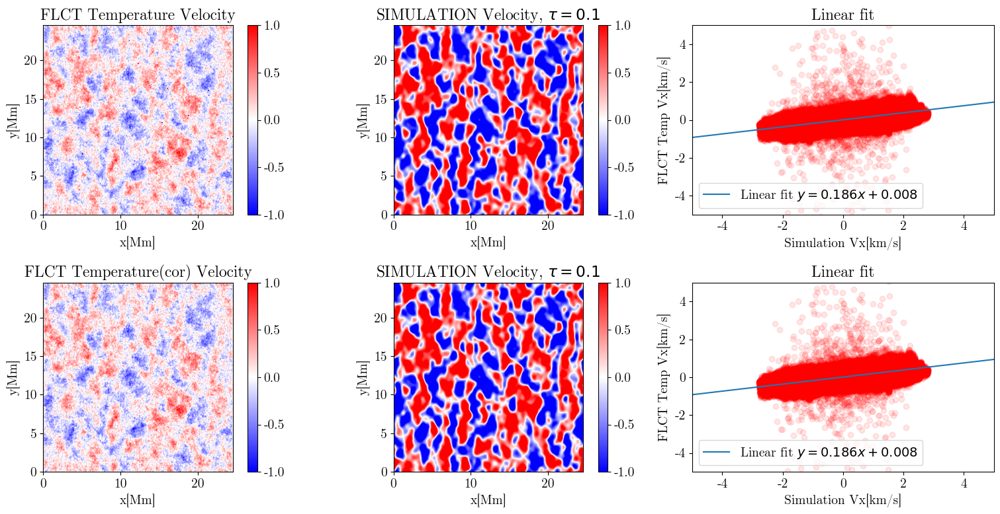

In [87]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp1_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.1$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm1_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm1_filtered600[:,:].flatten(), Vx_Temp1_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m, b, *_ = linregress(Vxm1_filtered600.flatten(), Vx_Temp1_mean.flatten())
plt.axline(xy1=(0, b), slope=m, label=f'Linear fit $y = {m:.3f}x {b:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Temperature(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp1_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.1$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm1_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm1_filtered600[:,:].flatten(), Vx_Temp1_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
mc, bc, *_ = linregress(Vxm1_filtered600.flatten(), Vx_Temp1_cor.flatten())
plt.axline(xy1=(0, bc), slope=mc, label=f'Linear fit $y = {mc:.3f}x {bc:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])


fig.tight_layout()
plt.savefig("300FLCT_Temp_vs_SIM_logtaum1.png", dpi = 100)

<h3>$\log\tau=-2$</h3>

In [88]:
Vx_Temp2 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Temp_tracked.fits")[0].data
Vy_Temp2 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Temp_tracked.fits")[1].data

In [89]:
Vx_Temp2_mean = temporal_avg(Vx_Temp2, 0, 90)
Vy_Temp2_mean = temporal_avg(Vy_Temp2, 0, 90)

In [90]:
Vx_Temp2_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Temp_tracked.fits")
Vy_Temp2_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum2Temp_tracked.fits")

In [91]:
Rxm2_regT = pearsonr((Vxm2[0]/1E5).flatten(), Vx_Temp2[0].flatten())
print(Rxm2_regT)

PearsonRResult(statistic=0.0028277179088752433, pvalue=1.4030643591105847e-05)


In [92]:
Rym2_regT = pearsonr((Vym2[0]/1E5).flatten(), Vy_Temp2[0].flatten())
print(Rym2_regT)

PearsonRResult(statistic=0.007871362176348524, pvalue=1.1842856178024778e-33)


In [93]:
Rxm2_tavT = pearsonr(Vxm2_mean.flatten(), Vx_Temp2_mean.flatten())
print(Rxm2_tavT)

PearsonRResult(statistic=0.04704560750618593, pvalue=0.0)


In [94]:
Rym2_tavT = pearsonr(Vym2_mean.flatten(), Vy_Temp2_mean.flatten())
print(Rym2_tavT)

PearsonRResult(statistic=0.03290878457255049, pvalue=0.0)


<h3 style="color:teal">Corrected pixel values</h3>

In [95]:
RRRRx2 = pearsonr(Vxm2_filtered600.flatten(), Vx_Temp2_cor.flatten())
print(RRRRx2)
RRRRy2 = pearsonr(Vym2_filtered600.flatten(), Vy_Temp2_cor.flatten())
print(RRRRy2)

PearsonRResult(statistic=0.32987110717106877, pvalue=0.0)
PearsonRResult(statistic=0.34899947081175375, pvalue=0.0)


<h3>Usually done values</h3>

In [96]:
Rxm2_filT = pearsonr(Vxm2_filtered600.flatten(), Vx_Temp2_mean.flatten())
print(Rxm2_filT)

PearsonRResult(statistic=0.05227097096110914, pvalue=0.0)


In [97]:
Rym2_filT = pearsonr(Vym2_filtered600.flatten(), Vy_Temp2_mean.flatten())
print(Rym2_filT)

PearsonRResult(statistic=0.0362557295051827, pvalue=0.0)


/tmp/ipykernel_4828/4099683364.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/4099683364.py:58: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Temp_vs_SIM_logtaum2.png", dpi = 100)


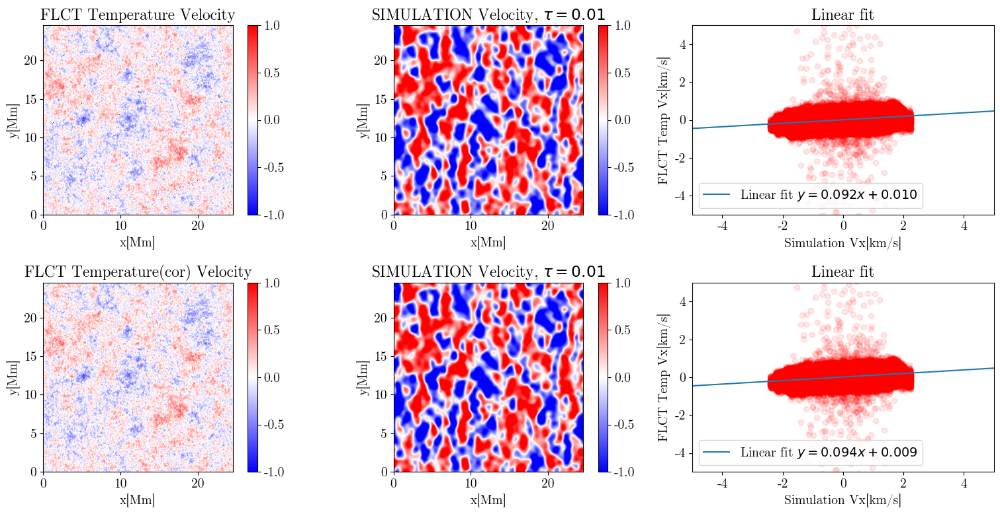

In [98]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp2_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.01$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm2_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm2_filtered600[:,:].flatten(), Vx_Temp2_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m2, b2, *_ = linregress(Vxm2_filtered600.flatten(), Vx_Temp2_mean.flatten())
plt.axline(xy1=(0, b2), slope=m2, label=f'Linear fit $y = {m2:.3f}x {b2:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Temperature(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp2_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.01$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm2_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm2_filtered600[:,:].flatten(), Vx_Temp2_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m2c, b2c, *_ = linregress(Vxm2_filtered600.flatten(), Vx_Temp2_cor.flatten())
plt.axline(xy1=(0, b2c), slope=m2c, label=f'Linear fit $y = {m2c:.3f}x {b2c:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])



fig.tight_layout()
plt.savefig("300FLCT_Temp_vs_SIM_logtaum2.png", dpi = 100)

<h3>$\log\tau=-3$</h3>

In [99]:
Vx_Temp3 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Temp_tracked.fits")[0].data
Vy_Temp3 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Temp_tracked.fits")[1].data

In [100]:
fh = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Temp_tracked.fits")[0]
fh.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1536                                                  
NAXIS2  =                 1536                                                  
NAXIS3  =                  120                                                  
EXTEND  =                    T                                                  
UNITS   = 'km/s    '                                                            
TRACKED = 'Bz      '                                                            
WHEN_RUN=   1739963762.5447645                                                  
AUTHOR  = 'Teodor  '                                                            
TAU     =                  1.0                                                  
FWHM    =                  3

In [101]:
Vx_Temp3_mean = temporal_avg(Vx_Temp3, 0, 90)
Vy_Temp3_mean = temporal_avg(Vy_Temp3, 0, 90)

In [102]:
Vx_Temp3_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Temp_tracked.fits")
Vy_Temp3_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum3Temp_tracked.fits")

In [103]:
Rxm3_regT = pearsonr((Vxm3[0]/1E5).flatten(), Vx_Temp3[0].flatten())
print(Rxm3_regT)

PearsonRResult(statistic=-0.001656352886132137, pvalue=0.010954138792472872)


In [104]:
Rym3_regT = pearsonr((Vym3[0]/1E5).flatten(), Vy_Temp3[0].flatten())
print(Rym3_regT)

PearsonRResult(statistic=-0.00341820418229557, pvalue=1.5179055632421006e-07)


In [105]:
Rxm3_tavT = pearsonr(Vxm3_mean.flatten(), Vx_Temp3_mean.flatten())
print(Rxm3_tavT)

PearsonRResult(statistic=0.03415499598228196, pvalue=0.0)


In [106]:
Rym3_tavT = pearsonr(Vym3_mean.flatten(), Vy_Temp3_mean.flatten())
print(Rym3_tavT)

PearsonRResult(statistic=0.02007069948410997, pvalue=9.86061981875362e-209)


<h3 style = "color:teal">Corrected pixel values</h3>

In [107]:
RRRRx3 = pearsonr(Vxm3_filtered600.flatten(), Vx_Temp3_cor.flatten())
print(RRRRx3)
RRRRy3 = pearsonr(Vym3_filtered600.flatten(), Vy_Temp3_cor.flatten())
print(RRRRy3)

PearsonRResult(statistic=0.05372205987462049, pvalue=0.0)
PearsonRResult(statistic=0.052114137262920454, pvalue=0.0)


<h3>Usually done values</h3>

In [108]:
Rxm3_filT = pearsonr(Vxm3_filtered600.flatten(), Vx_Temp3_mean.flatten())
print(Rxm3_filT)

PearsonRResult(statistic=0.0387300365262871, pvalue=0.0)


In [109]:
Rym3_filT = pearsonr(Vym3_filtered600.flatten(), Vy_Temp3_mean.flatten())
print(Rym3_filT)

PearsonRResult(statistic=0.022850854970855605, pvalue=5.965532203374643e-270)


/tmp/ipykernel_4828/2341174369.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/2341174369.py:58: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Temp_vs_SIM_logtaum3.png", dpi = 100)


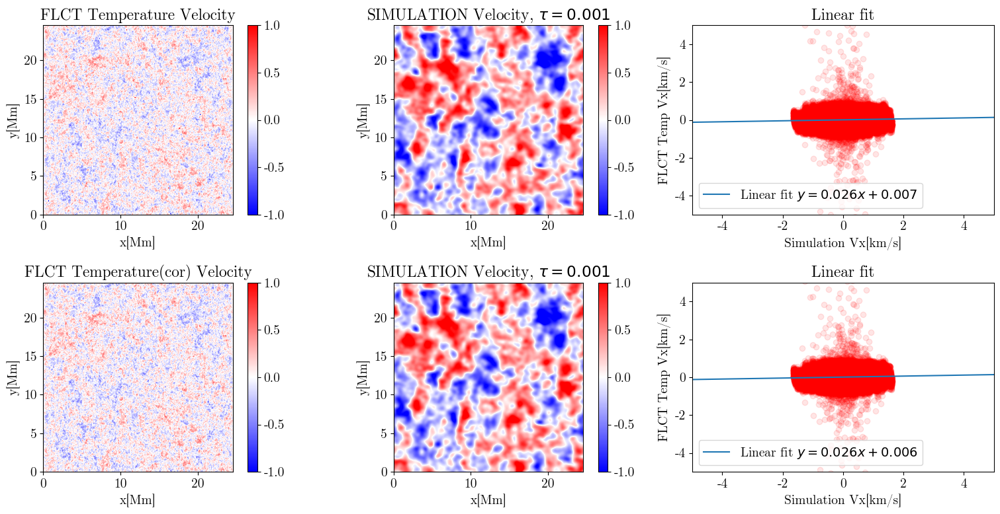

In [110]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp3_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm3_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm3_filtered600[:,:].flatten(), Vx_Temp3_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m3, b3, *_ = linregress(Vxm3_filtered600.flatten(), Vx_Temp3_mean.flatten())
plt.axline(xy1=(0, b3), slope=m3, label=f'Linear fit $y = {m3:.3f}x {b3:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Temperature(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp3_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm3_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm3_filtered600[:,:].flatten(), Vx_Temp3_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m3c, b3c, *_ = linregress(Vxm3_filtered600.flatten(), Vx_Temp3_cor.flatten())
plt.axline(xy1=(0, b3c), slope=m3c, label=f'Linear fit $y = {m3c:.3f}x {b3c:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])



fig.tight_layout()
plt.savefig("300FLCT_Temp_vs_SIM_logtaum3.png", dpi = 100)

<h3>$\log\tau$ = -4</h3>

In [111]:
Vx_Temp4 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Temp_tracked.fits")[0].data
Vy_Temp4 = fits.open("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Temp_tracked.fits")[1].data

In [112]:
Vx_Temp4_mean = temporal_avg(Vx_Temp4, 0, 90)
Vy_Temp4_mean = temporal_avg(Vy_Temp4, 0, 90)

In [113]:
Vx_Temp4_cor = mean_v_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Temp_tracked.fits")
Vy_Temp4_cor = mean_vy_from_file("pyFLCT_vx_vy_fwhm_300_dt_30_logTaum4Temp_tracked.fits")

In [114]:
Rxm4_regT = pearsonr((Vxm4[0]/1E5).flatten(), Vx_Temp4[0].flatten())
print(Rxm4_regT)

PearsonRResult(statistic=0.0034923019971503746, pvalue=8.131355642677643e-08)


In [115]:
Rym4_regT = pearsonr((Vym4[0]/1E5).flatten(), Vy_Temp4[0].flatten())
print(Rym4_regT)

PearsonRResult(statistic=0.004213264157672166, pvalue=9.69711659708358e-11)


In [116]:
Rxm4_tavT = pearsonr(Vxm4_mean.flatten(), Vx_Temp4_mean.flatten())
print(Rxm4_tavT)

PearsonRResult(statistic=0.051563489465748125, pvalue=0.0)


In [117]:
Rym4_tavT = pearsonr(Vym4_mean.flatten(), Vy_Temp4_mean.flatten())
print(Rym4_tavT)

PearsonRResult(statistic=0.06981978604444013, pvalue=0.0)


<h3 style = "color:teal">Corrected values</h3>

In [118]:
RRRRx4 = pearsonr(Vxm4_filtered600.flatten(), Vx_Temp4_cor.flatten())
print(RRRRx4)
RRRRy4 = pearsonr(Vym4_filtered600.flatten(), Vy_Temp4_cor.flatten())
print(RRRRy4)

PearsonRResult(statistic=0.11020139900858371, pvalue=0.0)
PearsonRResult(statistic=0.12196635486048098, pvalue=0.0)


<h3>Usually done values</h3>

In [119]:
Rxm4_filT = pearsonr(Vxm4_filtered600.flatten(), Vx_Temp4_mean.flatten())
print(Rxm4_filT)

PearsonRResult(statistic=0.05514368638493555, pvalue=0.0)


In [120]:
Rym4_filT = pearsonr(Vym4_filtered600.flatten(), Vy_Temp4_mean.flatten())
print(Rym4_filT)

PearsonRResult(statistic=0.07532727671583442, pvalue=0.0)


/tmp/ipykernel_4828/796946207.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/796946207.py:58: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("300FLCT_Temp_vs_SIM_logtaum4.png", dpi = 100)


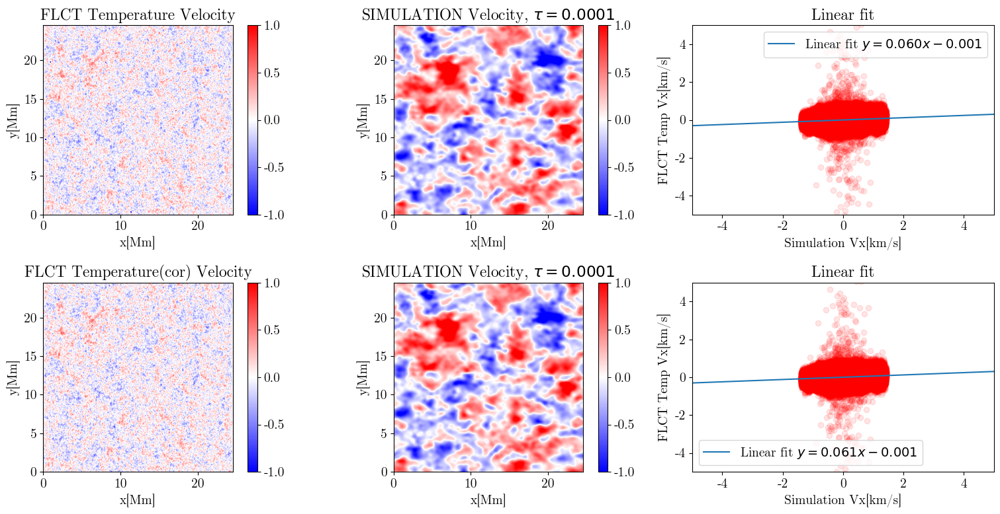

In [121]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp4_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.0001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm4_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm4_filtered600[:,:].flatten(), Vx_Temp4_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m4, b4, *_ = linregress(Vxm4_filtered600.flatten(), Vx_Temp4_mean.flatten())
plt.axline(xy1=(0, b4), slope=m4, label=f'Linear fit $y = {m4:.3f}x {b4:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Temperature(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp4_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=0.0001$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm4_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm4_filtered600[:,:].flatten(), Vx_Temp4_cor[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m4c, b4c, *_ = linregress(Vxm4_filtered600.flatten(), Vx_Temp4_cor.flatten())
plt.axline(xy1=(0, b4c), slope=m4c, label=f'Linear fit $y = {m4c:.3f}x {b4c:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])



fig.tight_layout()
plt.savefig("300FLCT_Temp_vs_SIM_logtaum4.png", dpi = 100)

<h2>15. 01. 2025.</h2>

<h3>Tracking on intensity that Mattias provided</h3>

<h3>$\log\tau = 0$</h3>

In [122]:
Vx_Inte0_cor = mean_v_from_file("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")
Vy_Inte0_cor = mean_vy_from_file("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")

In [123]:
Vx_Inte0 = fits.open("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")[0].data
Vy_Inte0 = fits.open("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")[1].data

In [124]:
Vx_Inte0_mean = temporal_avg(Vx_Inte0, 0, 90)
Vy_Inte0_mean = temporal_avg(Vy_Inte0, 0, 90)

In [125]:
Rxm0_regI = pearsonr((Vxm0[0]/1E5).flatten(), Vx_Inte0[0].flatten())
print(Rxm0_regI)

PearsonRResult(statistic=0.5616806448561728, pvalue=0.0)


In [126]:
Rym0_regI = pearsonr((Vym0[0]/1E5).flatten(), Vy_Inte0[0].flatten())
print(Rym0_regI)

PearsonRResult(statistic=0.5505031119930177, pvalue=0.0)


In [127]:
Rxm0_tavI = pearsonr(Vxm0_mean.flatten(), Vx_Inte0_mean.flatten())
print(Rxm0_tavI)

PearsonRResult(statistic=0.8173243422065646, pvalue=0.0)


In [128]:
Rym0_tavI = pearsonr(Vym0_mean.flatten(), Vy_Inte0_mean.flatten())
print(Rym0_tavI)

PearsonRResult(statistic=0.8121617562084135, pvalue=0.0)


<h3 style = "color:teal">Corrected pixel values</h3>

In [129]:
RRRRx0I = pearsonr(Vxm0_filtered600.flatten(), Vx_Inte0_cor.flatten())
print(RRRRx0I)
RRRRy0I = pearsonr(Vym0_filtered600.flatten(), Vy_Inte0_cor.flatten())
print(RRRRy0I)

PearsonRResult(statistic=0.9374428154657203, pvalue=0.0)
PearsonRResult(statistic=0.9324454198451985, pvalue=0.0)


<h3>Usually done values</h3>

In [130]:
Rxm0_filI = pearsonr(Vxm0_filtered600.flatten(), Vx_Inte0_mean.flatten())
print(Rxm0_filI)

PearsonRResult(statistic=0.9375096284141713, pvalue=0.0)


In [131]:
Rym0_filI = pearsonr(Vym0_filtered600.flatten(), Vy_Inte0_mean.flatten())
print(Rym0_filI)

PearsonRResult(statistic=0.9325966781440204, pvalue=0.0)


/tmp/ipykernel_4828/1670083157.py:56: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/1670083157.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("FLCT_Inte_vs_SIM_logtaum0.png", dpi = 100)


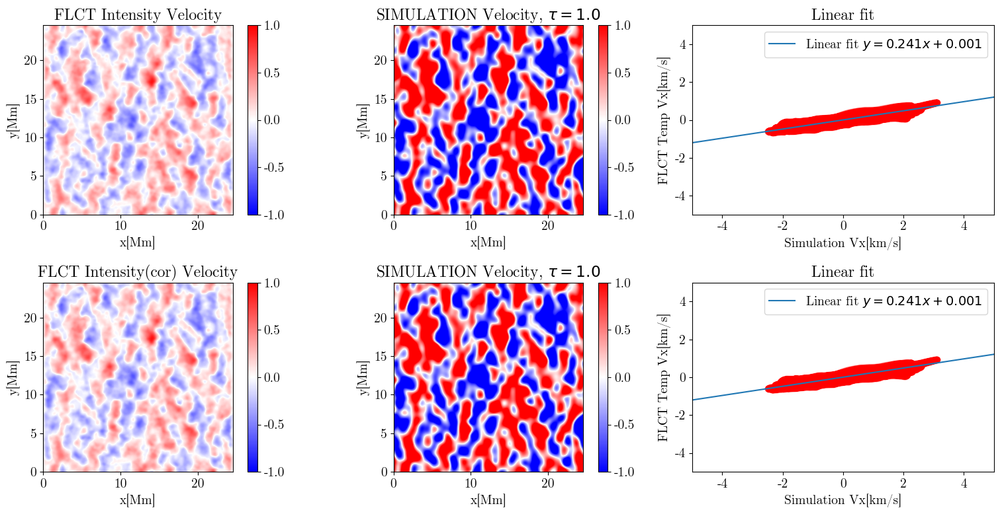

In [132]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Intensity Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Inte0_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Inte0_mean[:,:].flatten(), alpha=0.01, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0i, b0i, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Inte0_mean.flatten())
plt.axline(xy1=(0, b0i), slope=m0i, label=f'Linear fit $y = {m0i:.3f}x {b0i:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Intensity(cor) Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Inte0_cor[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Inte0_cor[:,:].flatten(), alpha=0.01, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0ci, b0ci, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Inte0_cor.flatten())
plt.axline(xy1=(0, b0ci), slope=m0ci, label=f'Linear fit $y = {m0ci:.3f}x {b0ci:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])


fig.tight_layout()
plt.savefig("FLCT_Inte_vs_SIM_logtaum0.png", dpi = 100)

<h3>Temperature and Intensity tracked vs Simulated velocities at $\log\tau=0$</h3>

/tmp/ipykernel_4828/1388287244.py:56: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/tmp/ipykernel_4828/1388287244.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("FLCT_TempInte_vs_SIM_logtaum0.png", dpi = 100)


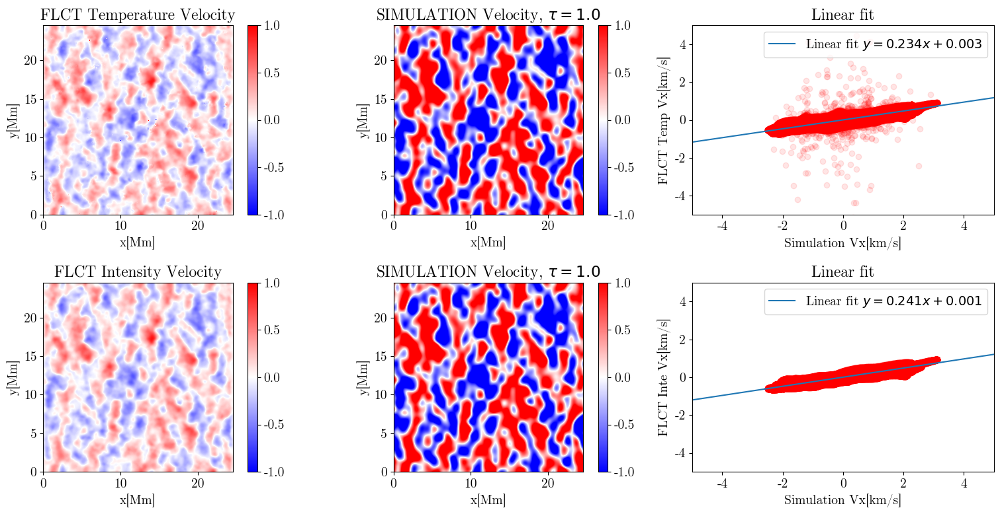

In [133]:
fig = plt.figure(figsize=[16, 8])       
#plt.suptitle("Simulated velocities averaged to 15 min; 10 s vs 20, 30, 40, 50, 60 s cadence")# atmos[0] tau


plt.subplot(231)                                      # atmos[1] temp
plt.title("FLCT Temperature Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Temp0_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(232)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(233)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Temp0_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Temp Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0v, b0v, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Temp0_mean.flatten())
plt.axline(xy1=(0, b0v), slope=m0v, label=f'Linear fit $y = {m0v:.3f}x {b0v:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])

plt.subplot(234)                                      # atmos[1] temp
plt.title("FLCT Intensity Velocity")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_Inte0_mean[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(235)                                      # atmos[1] temp
plt.title("SIMULATION Velocity, $\\tau=1.0$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vxm0_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(236)
plt.scatter(Vxm0_filtered600[:,:].flatten(), Vx_Inte0_mean[:,:].flatten(), alpha=0.10, color = 'red')
plt.title("Linear fit")  
plt.ylabel("FLCT Inte Vx[km/s]")
plt.xlabel("Simulation Vx[km/s]")
m0cs, b0cs, *_ = linregress(Vxm0_filtered600.flatten(), Vx_Inte0_mean.flatten())
plt.axline(xy1=(0, b0cs), slope=m0cs, label=f'Linear fit $y = {m0cs:.3f}x {b0cs:+.3f}$')
plt.legend()
plt.xlim([-5,5])
plt.ylim([-5,5])


fig.tight_layout()
plt.savefig("FLCT_TempInte_vs_SIM_logtaum0.png", dpi = 100)

<h3 style = "color:green">Tracking Temperature vs. Intensity at $\log\tau=0$</h3>

<h3>Without correction</h3>

In [134]:
RxTI = pearsonr(Vx_Inte0_mean.flatten(), Vx_Temp0_mean.flatten())
print(RxTI)

RyTI = pearsonr(Vy_Inte0_mean.flatten(), Vy_Temp0_mean.flatten())
print(RyTI)

PearsonRResult(statistic=0.7262369269903569, pvalue=0.0)
PearsonRResult(statistic=0.8395258693116945, pvalue=0.0)


/home/mistflow/anaconda3/envs/flct/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


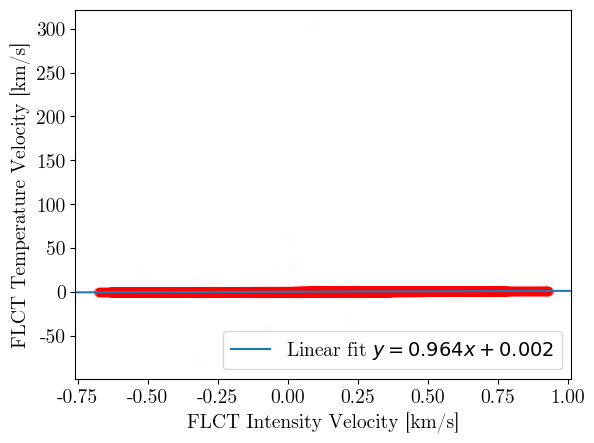

In [135]:
plt.scatter(Vx_Inte0_mean.flatten(), Vx_Temp0_mean.flatten(), alpha=0.01, color = 'red')
plt.xlabel("FLCT Intensity Velocity [km/s]")
plt.ylabel("FLCT Temperature Velocity [km/s]")
mIII, bIII, *_ = linregress(Vx_Inte0_mean.flatten(), Vx_Temp0_mean.flatten())
plt.axline(xy1=(0, bIII), slope=mIII, label=f'Linear fit $y = {mIII:.3f}x {bIII:+.3f}$')
plt.legend()

<h3>With correction</h3>

In [136]:
RxTIcor = pearsonr(Vx_Inte0_cor.flatten(), Vx_Temp0_cor.flatten())
print(RxTIcor)

RyTIcor = pearsonr(Vy_Inte0_cor.flatten(), Vy_Temp0_cor.flatten())
print(RyTIcor)

PearsonRResult(statistic=0.9725430925695109, pvalue=0.0)
PearsonRResult(statistic=0.9724957074402408, pvalue=0.0)


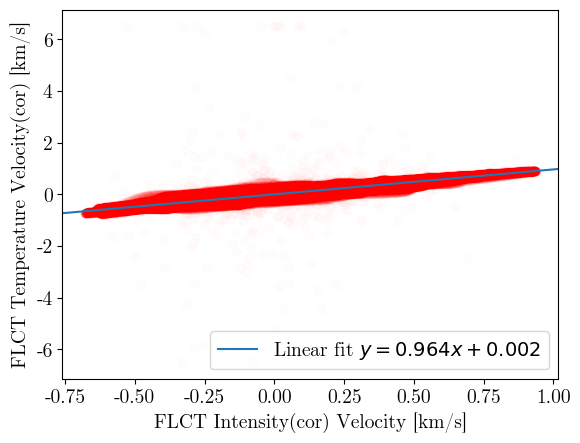

In [137]:
plt.scatter(Vx_Inte0_cor.flatten(), Vx_Temp0_cor.flatten(), alpha=0.01, color = 'red')
plt.xlabel("FLCT Intensity(cor) Velocity [km/s]")
plt.ylabel("FLCT Temperature Velocity(cor) [km/s]")
mIIIc, bIIIc, *_ = linregress(Vx_Inte0_cor.flatten(), Vx_Temp0_cor.flatten())
plt.axline(xy1=(0, bIIIc), slope=mIIIc, label=f'Linear fit $y = {mIIIc:.3f}x {bIIIc:+.3f}$')
plt.legend()

In [138]:
Rxm0_filT_1 = pearsonr(Vxm0_filtered600.flatten(), Vx_Temp0_mean.flatten())
print(Rxm0_filT_1)

PearsonRResult(statistic=0.6876213922846197, pvalue=0.0)


In [139]:
RRRRx0T_1 = pearsonr(Vxm0_filtered600.flatten(), Vx_Temp0_cor.flatten())
print(RRRRx0T_1)

PearsonRResult(statistic=0.9208954490230603, pvalue=0.0)


In [140]:
np.shape(Vx_Temp0)

(360, 1536, 1536)

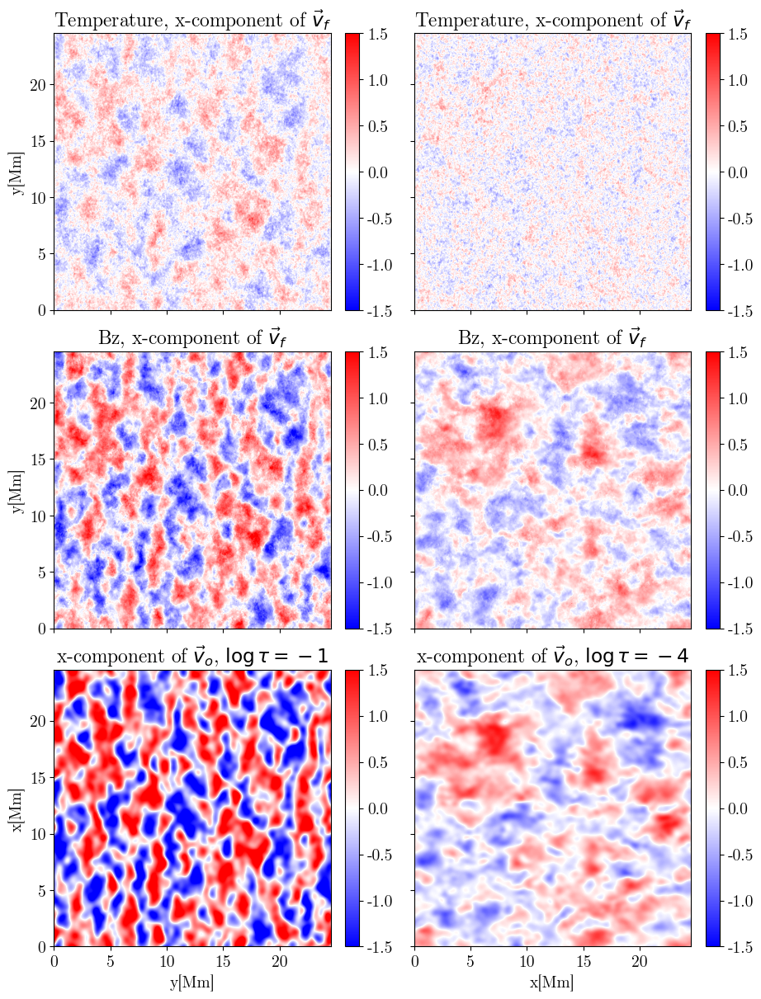

In [148]:
fig = plt.figure(constrained_layout=True, figsize = (9,12))
#plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((3,2), (0,0))
ax1.set_title("Temperature, x-component of $\\vec{v}_f$")
#ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
ax1.set_xticklabels([])
im1 = ax1.imshow(Vx_Temp1_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im1)

ax2 = plt.subplot2grid((3,2), (1,0))
ax2.set_title("Bz, x-component of $\\vec{v}_f$")
#ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
ax2.set_xticklabels([])
#ax2.set_yticklabels([])
im2 = ax2.imshow(Vx_Bz1_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im2)

ax3 = plt.subplot2grid((3,2), (2,0))
ax3.set_title("x-component of $\\vec{v}_o$, $\log\\tau = -1$")                              
ax3.set_ylabel("x[Mm]")
ax3.set_xlabel("y[Mm]")
#ax3.set_xticklabels([])
#ax3.set_yticklabels([])
im3 = ax3.imshow(Vxm1_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im3)

'''
ax4 = plt.subplot2grid((4,3), (1,0))
ax4.set_title("FLCT Temperature Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(Vx_Temp2_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("FLCT Bz Vx")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vx_Bz2_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title("Vx convolved with Gaussian FWHM = 600 km, $\\tau = 0.01$")                              
ax6.set_ylabel("x[Mm]")
ax6.set_xlabel("y[Mm]")
im6 = ax6.imshow(Vxm2_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im6)

ax7 = plt.subplot2grid((4,3), (2,0))
ax7.set_title("FLCT Temperature Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(Vx_Temp3_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("FLCT Bz Vx")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vx_Bz3_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title("Vx convolved with Gaussian FWHM = 600 km, $\\tau = 0.001$")                              
ax9.set_ylabel("x[Mm]")
ax9.set_xlabel("y[Mm]")
im9 = ax9.imshow(Vxm3_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im9)
'''
ax10 = plt.subplot2grid((3,2), (0,1))
ax10.set_title("Temperature, x-component of $\\vec{v}_f$")
#ax10.set_xlabel("x[Mm]")
#ax10.set_ylabel("y[Mm]")
ax10.set_yticklabels([])
ax10.set_xticklabels([])
im10 = ax10.imshow(Vx_Temp4_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im10)

ax11 = plt.subplot2grid((3,2), (1,1))
ax11.set_title("Bz, x-component of $\\vec{v}_f$")
#ax11.set_xlabel("x[Mm]")
#ax11.set_ylabel("y[Mm]")
ax11.set_yticklabels([])
ax11.set_xticklabels([])
im11 = ax11.imshow(Vx_Bz4_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im11)

ax12 = plt.subplot2grid((3,2), (2,1))
ax12.set_title("x-component of $\\vec{v}_o$, $\log\\tau = -4$")                              
#ax12.set_ylabel("y[Mm]")
ax12.set_xlabel("x[Mm]")
ax12.set_yticklabels([])
im12 = ax12.imshow(Vxm4_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im12)
'''
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
#fig.subplots_adjust(right=0.9)
#cbar_ax = fig.add_axes([0.9, 0.15, 0.05, 0.7])
axins = inset_axes(ax11,
                    width="5%",  
                    height="200%",
                    loc='center right',
                    borderpad=-5
                   )
#fig.subplots_adjust(top=0.95)
#cbar_ax = fig.add_axes([0.15, 0.92, 0.7, 0.05])

cbar = fig.colorbar(im1, cax=axins)
cbar.set_label('$V_x$ [km/s]')
'''

#fig.tight_layout()
plt.savefig("2Col300TempandBz_vs_Sim.png", dpi = 70)

<h2>05. 02. 2025.</h2>

<h3>Plots for Masha</h3>

RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

/home/mistflow/anaconda3/envs/flct/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/mistflow/anaconda3/envs/flct/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


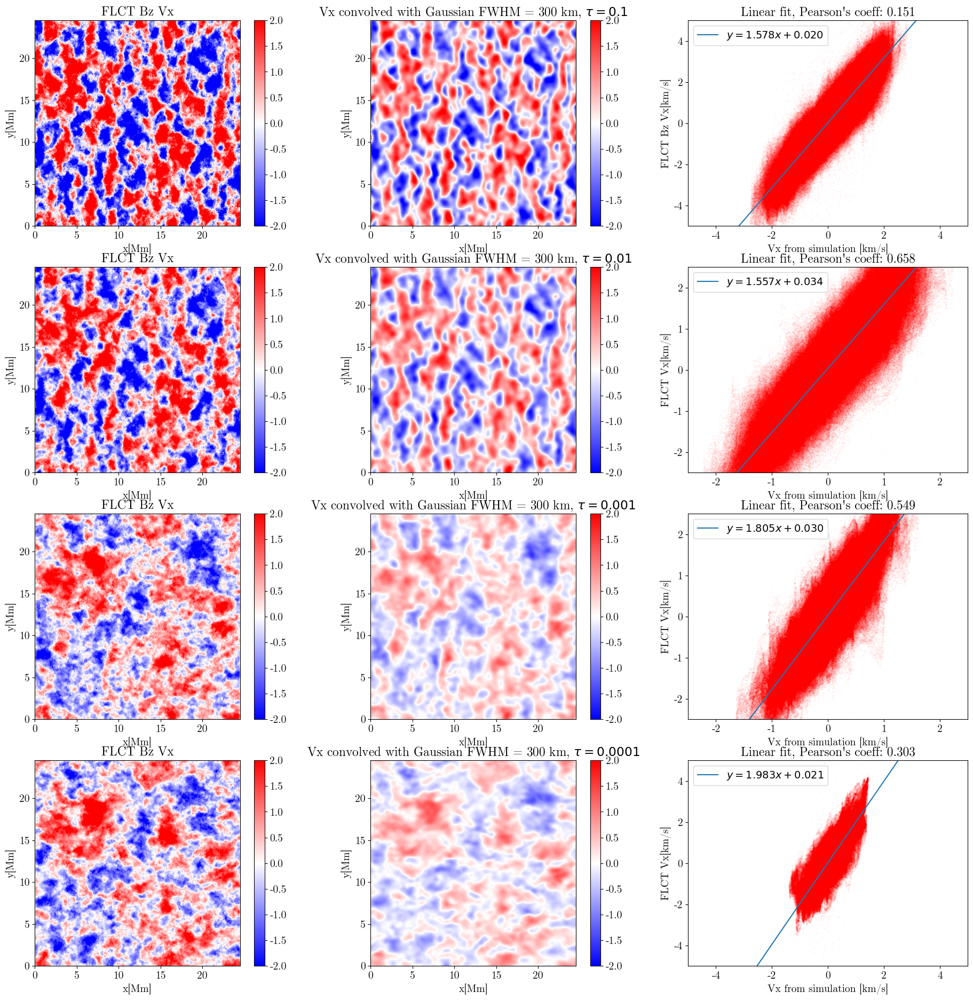

In [142]:
plt.figure(figsize = (23,23))
#plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("FLCT Bz Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(3*Vx_Bz1_mean[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.1$")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vxm1_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title(f"Linear fit, Pearson's coeff: {(Rxm1_fil[0]):.3f}")                               
ax3.set_ylabel("FLCT Bz Vx[km/s]")
ax3.set_xlabel("Vx from simulation [km/s]")
ax3.set_xlim(-5,5)
ax3.set_ylim(-5,5)
ax3.scatter(Vxm1_filtered600.flatten(), 3*Vx_Bz1_mean.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vxm1_filtered600.flatten(), 3*Vx_Bz1_mean.flatten())
ax3.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.3f}x {b1:+.3f}$')
plt.legend()

ax4 = plt.subplot2grid((4,3), (1,0))
ax4.set_title("FLCT Bz Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(3*Vx_Bz2_mean[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.01$")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vxm2_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title(f"Linear fit, Pearson's coeff: {(Rxm2_fil[0]):.3f}")                                
ax6.set_ylabel("FLCT Vx[km/s]")
ax6.set_xlabel("Vx from simulation [km/s]")
ax6.set_xlim(-2.5,2.5)
ax6.set_ylim(-2.5,2.5)
ax6.scatter(Vxm2_filtered600.flatten(), 3*Vx_Bz2_mean.flatten(), s = 0.001, color="red")
m2, b2, *_ = linregress(Vxm2_filtered600.flatten(), 3*Vx_Bz2_mean.flatten())
ax6.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.3f}x {b2:+.3f}$')
plt.legend()

ax7 = plt.subplot2grid((4,3), (2,0))
ax7.set_title("FLCT Bz Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(3*Vx_Bz3_mean[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.001$")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vxm3_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title(f"Linear fit, Pearson's coeff: {(Rxm3_fil[0]):.3f}")                                
ax9.set_ylabel("FLCT Vx[km/s]")
ax9.set_xlabel("Vx from simulation [km/s]")
ax9.set_xlim(-2.5,2.5)
ax9.set_ylim(-2.5,2.5)
ax9.scatter(Vxm3_filtered600.flatten(), 3*Vx_Bz3_mean.flatten(), s = 0.001, color="red")
m3, b3, *_ = linregress(Vxm3_filtered600.flatten(), 3*Vx_Bz3_mean.flatten())
ax9.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.3f}x {b3:+.3f}$')
plt.legend()

ax10 = plt.subplot2grid((4,3), (3,0))
ax10.set_title("FLCT Bz Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(3*Vx_Bz4_mean[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.0001$")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vxm4_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title(f"Linear fit, Pearson's coeff: {(Rxm4_fil[0]):.3f}")                                
ax12.set_ylabel("FLCT Vx[km/s]")
ax12.set_xlabel("Vx from simulation [km/s]")
ax12.set_xlim(-5,5)
ax12.set_ylim(-5,5)
ax12.scatter(Vxm4_filtered600.flatten(), 3*Vx_Bz4_mean.flatten(), s = 0.001, color="red")
m4, b4, *_ = linregress(Vxm4_filtered600.flatten(), 3*Vx_Bz4_mean.flatten())
ax12.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.3f}x {b4:+.3f}$')
plt.legend()

fig.tight_layout()
plt.savefig("300Bz_vs_Sim.png", dpi = 200)

RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

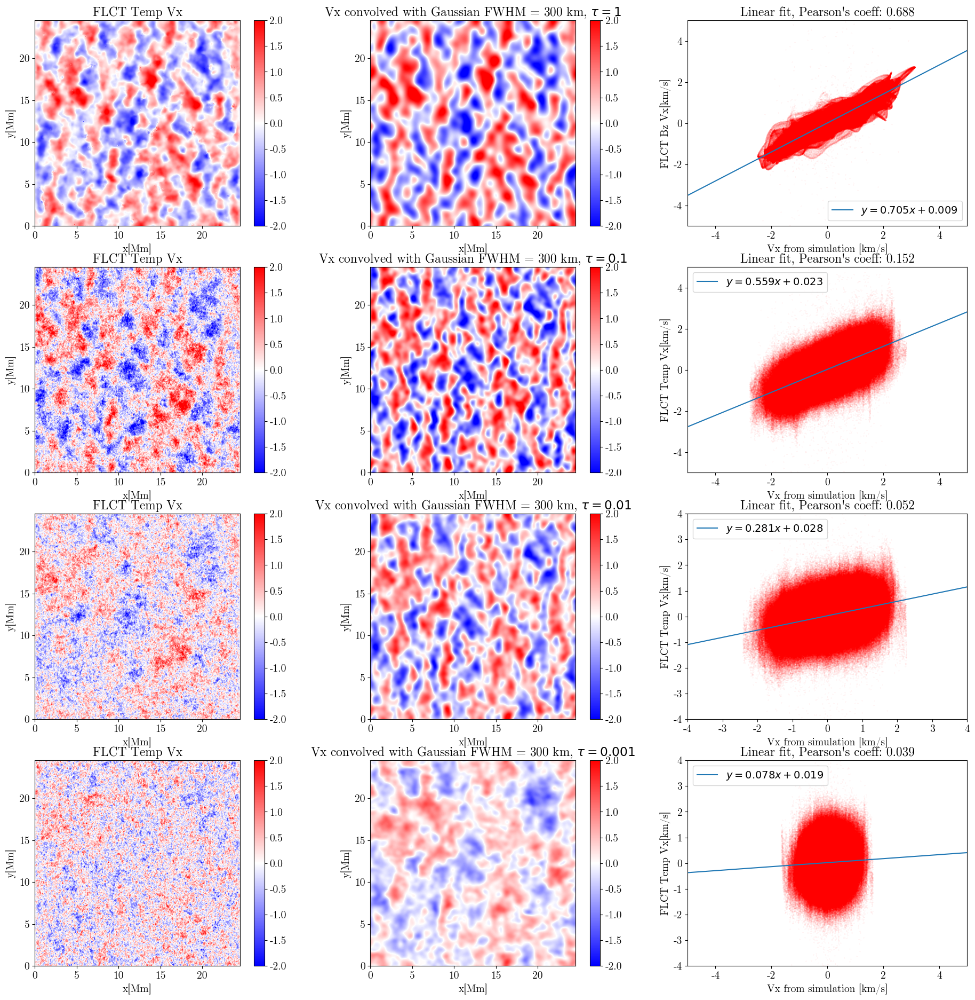

In [143]:
plt.figure(figsize = (23,23))
#plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("FLCT Temp Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(3*Vx_Temp0_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 1$")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vxm0_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title(f"Linear fit, Pearson's coeff: {(Rxm0_filT[0]):.3f}")                              
ax3.set_ylabel("FLCT Bz Vx[km/s]")
ax3.set_xlabel("Vx from simulation [km/s]")
ax3.set_xlim(-5,5)
ax3.set_ylim(-5,5)
ax3.scatter(Vxm0_filtered600.flatten(), 3*Vx_Temp0_cor.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vxm0_filtered600.flatten(), 3*Vx_Temp0_cor.flatten())
ax3.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.3f}x {b1:+.3f}$')
plt.legend()

ax4 = plt.subplot2grid((4,3), (1,0))
ax4.set_title("FLCT Temp Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(3*Vx_Temp1_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.1$")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vxm1_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title(f"Linear fit, Pearson's coeff: {(Rxm1_filT[0]):.3f}")                                
ax6.set_ylabel("FLCT Temp Vx[km/s]")
ax6.set_xlabel("Vx from simulation [km/s]")
ax6.set_xlim(-5,5)
ax6.set_ylim(-5,5)
ax6.scatter(Vxm1_filtered600.flatten(), 3*Vx_Temp1_cor.flatten(), s = 0.001, color="red")
m2, b2, *_ = linregress(Vxm1_filtered600.flatten(), 3*Vx_Temp1_cor.flatten())
ax6.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.3f}x {b2:+.3f}$')
plt.legend()

ax7 = plt.subplot2grid((4,3), (2,0))
ax7.set_title("FLCT Temp Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(3*Vx_Temp2_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.01$")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vxm2_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title(f"Linear fit, Pearson's coeff: {(Rxm2_filT[0]):.3f}")                                
ax9.set_ylabel("FLCT Temp Vx[km/s]")
ax9.set_xlabel("Vx from simulation [km/s]")
ax9.set_xlim(-4,4)
ax9.set_ylim(-4,4)
ax9.scatter(Vxm2_filtered600.flatten(), 3*Vx_Temp2_cor.flatten(), s = 0.001, color="red")
m3, b3, *_ = linregress(Vxm2_filtered600.flatten(), 3*Vx_Temp2_cor.flatten())
ax9.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.3f}x {b3:+.3f}$')
plt.legend()

ax10 = plt.subplot2grid((4,3), (3,0))
ax10.set_title("FLCT Temp Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(3*Vx_Temp3_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.001$")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vxm3_filtered600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -2, vmax = 2)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title(f"Linear fit, Pearson's coeff: {(Rxm3_filT[0]):.3f}")                                
ax12.set_ylabel("FLCT Temp Vx[km/s]")
ax12.set_xlabel("Vx from simulation [km/s]")
ax12.set_xlim(-5,5)
ax12.set_ylim(-4,4)
ax12.scatter(Vxm3_filtered600.flatten(), 3*Vx_Temp3_cor.flatten(), s = 0.001, color="red")
m4, b4, *_ = linregress(Vxm3_filtered600.flatten(), 3*Vx_Temp3_cor.flatten())
ax12.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.3f}x {b4:+.3f}$')
plt.legend()

fig.tight_layout()
plt.savefig("300Temp_vs_Sim.png", dpi = 200)

<h2>18. 02. 2025.</h2>

In [ ]:
plt.figure(figsize = (23,23))
#plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("FLCT Temperature Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(Vx_Temp1_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("FLCT Bz Vx")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vx_Bz1_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.1$")                              
ax3.set_ylabel("x[Mm]")
ax3.set_xlabel("y[Mm]")
im3 = ax3.imshow(Vxm1_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im3)


ax4 = plt.subplot2grid((4,3), (1,0))
ax4.set_title("FLCT Temperature Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(Vx_Temp2_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("FLCT Bz Vx")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vx_Bz2_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.01$")                              
ax6.set_ylabel("x[Mm]")
ax6.set_xlabel("y[Mm]")
im6 = ax6.imshow(Vxm2_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im6)

ax7 = plt.subplot2grid((4,3), (2,0))
ax7.set_title("FLCT Temperature Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(Vx_Temp3_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("FLCT Bz Vx")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vx_Bz3_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.001$")                              
ax9.set_ylabel("x[Mm]")
ax9.set_xlabel("y[Mm]")
im9 = ax9.imshow(Vxm3_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im9)

ax10 = plt.subplot2grid((4,3), (3,0))
ax10.set_title("FLCT Temperature Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(Vx_Temp4_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("FLCT Bz Vx")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vx_Bz4_cor[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title("Vx convolved with Gaussian FWHM = 300 km, $\\tau = 0.0001$")                              
ax12.set_ylabel("x[Mm]")
ax12.set_xlabel("y[Mm]")
im12 = ax12.imshow(Vxm4_filtered600[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1.5, vmax = 1.5)
plt.colorbar(im12)

fig.tight_layout()
plt.savefig("300TempandBz_vs_Sim.png", dpi = 70)

In [ ]:
def divergence(f,h):
    """
    div(F) = dFx/dx + dFy/dy + ...
    g = np.gradient(Fx,dx, axis=1)+ np.gradient(Fy,dy, axis=0) #2D
    g = np.gradient(Fx,dx, axis=2)+ np.gradient(Fy,dy, axis=1) +np.gradient(Fz,dz,axis=0) #3D
    """
    num_dims = len(f)
    return np.ufunc.reduce(np.add, [np.gradient(f[i], h[i], axis=i) for i in range(num_dims)])


In [ ]:
NY = len(Vy_Bz4_cor)
ymin = np.min(Vy_Bz4_cor)
ymax = np.max(Vy_Bz4_cor)
dy = (ymax -ymin )/(NY-1.)

NX = NY
xmin = np.min(Vx_Bz4_cor)
xmax = np.max(Vx_Bz4_cor)
dx = (xmax -xmin)/(NX-1.)

rows = 1
cols = 2

plt.figure(figsize=(cols*3.5,rows*3.5))
xmin = 0
xmax = 1536
ymin = 0
ymax=  1536

Fx  = Vx_Bz4_cor
Fy  = Vy_Bz4_cor

F = [Fx, Fy]
h = [dx, dy]
g = divergence(F,h)
plt.title("Divergence map")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")     

Bgtx_disp = Vxm4[10,ymin:ymax,xmin:xmax]/1E5
Bgty_disp = Vym4[10,ymin:ymax,xmin:xmax]/1E5
Bgtz_disp = g[ymin:ymax,xmin:xmax]

ysize,xsize = np.shape(Bgtx_disp)

stride = 32


xmaxind = int(round(xsize/stride))
ymaxind = int(round(ysize/stride))
xstr, ystr = np.meshgrid(stride*np.arange(0,xmaxind),stride*np.arange(0,ymaxind))
im = plt.imshow(Bgtz_disp, origin = 'lower', cmap = "bwr", vmin = -6.5, vmax = 6.5)
plt.xticks([0,600,1200], [0, 9.6, 19.2])
plt.yticks([0,600,1200], [0, 9.6, 19.2])
plt.quiver(xstr,ystr,Bgtx_disp[::stride,::stride],Bgty_disp[::stride,::stride], headwidth = 3.5, headaxislength = 10, headlength = 8)
plt.colorbar(im)